<a href="https://colab.research.google.com/github/vpste1/mlscrapbook/blob/master/40kTrainer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Don't forget to set GPU-enabled runtime


In [6]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 13.6MB/s 
     |████████████████████████████████| 1.1MB 50.6MB/s 
     |████████████████████████████████| 51kB 9.0MB/s 
     |████████████████████████████████| 51kB 9.3MB/s 
     |████████████████████████████████| 194kB 53.8MB/s 
     |████████████████████████████████| 40kB 7.0MB/s 
     |████████████████████████████████| 92kB 12.8MB/s 
     |████████████████████████████████| 51kB 8.7MB/s 
     |████████████████████████████████| 61kB 10.9MB/s 
     |████████████████████████████████| 51kB 9.0MB/s 
     |████████████████████████████████| 2.6MB 48.8MB/s 
Mounted at /content/gdrive


In [7]:
from fastbook import *
from fastai.vision.widgets import *

In [19]:
def search_images(subscription_key , search_term):
    search_url = "https://api.bing.microsoft.com/v7.0/images/search"
    headers = {"Ocp-Apim-Subscription-Key" : subscription_key}
    params  = {"q": search_term, "imageType": "photo", "count": "150"}
    
    response = requests.get(search_url, headers=headers, params=params)
    response.raise_for_status()
    search_results = response.json()
    
    return search_results

In [8]:
key_str = input("Enter your Bing API key: ")
key = os.environ.get('AZURE_SEARCH_KEY', key_str)


Enter your Bing API key: 2be73fe4c4a3456b88284020b44248fb


In [11]:
unit_types = 'ork', 'space_marine', 'tyranid', 'adeptus_mechanicus'
path = Path('units')

In [20]:

for o in unit_types:
    print(o)
    dest = (path/o)
    dest.mkdir(exist_ok=True)
    results = search_images(key, f'Warhammer 40k {o.replace("_", " ")} painted model')
    download_images(dest, urls=[img['contentUrl'] for img in results['value']])

ork


space_marine


tyranid


adeptus_mechanicus


In [21]:
fns = get_image_files(path)
failed = verify_images(fns)
failed.map(Path.unlink);

In [25]:
models = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())


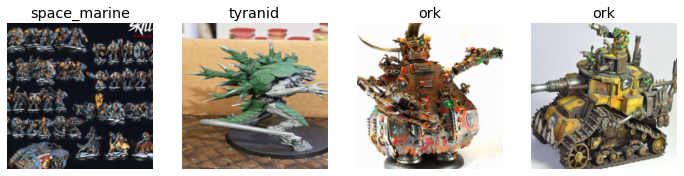

In [41]:

dls = models.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

In [42]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(8)

epoch,train_loss,valid_loss,error_rate,time
0,2.275558,1.013669,0.407080,00:17


epoch,train_loss,valid_loss,error_rate,time
0,1.430932,0.817692,0.309735,00:17
1,1.241618,0.711086,0.300885,00:16
2,1.051976,0.766302,0.283186,00:17
3,0.918431,0.808027,0.247788,00:16
4,0.796642,0.776401,0.283186,00:16
5,0.698613,0.762725,0.256637,00:16
6,0.616343,0.765998,0.238938,00:16
7,0.554434,0.773568,0.247788,00:16


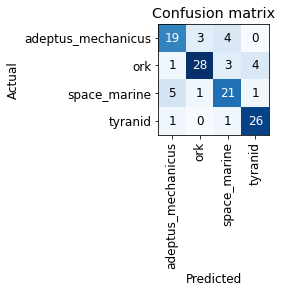

In [30]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

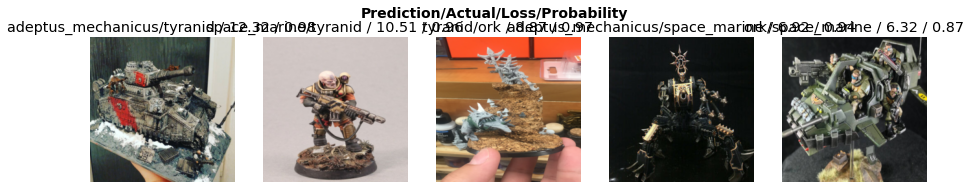

In [31]:
interp.plot_top_losses(5, nrows=1)

In [32]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [39]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()


In [36]:
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

NameError: ignored

In [44]:
learn.export()
